# Outliers

In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error
from prophet.diagnostics import cross_validation

In [4]:
url = 'https://github.com/allanspadini/livro-val-allan/raw/main/GlobalLandTemperaturesByCountry.csv'
dados = pd.read_csv(url)
dados.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland


In [5]:
# Rename Columns
dados.columns = ['Data', 'Temperatura', 'Incerteza', 'País']
dados_br = dados.query('País == "Brazil"')
dados_br = dados_br.dropna()
dados_br.head()

,Data,Temperatura,Incerteza,País
77110,1832-01-01,24.935,1.372,Brazil
77111,1832-02-01,24.505,1.953,Brazil
77112,1832-03-01,24.617,1.359,Brazil
77113,1832-04-01,23.990,2.013,Brazil
77114,1832-05-01,23.124,1.592,Brazil


In [6]:
df = pd.DataFrame()

df['ds'] = dados_br['Data']
df['y'] = dados_br['Temperatura']

df.head()

,ds,y
77110,1832-01-01,24.935
77111,1832-02-01,24.505
77112,1832-03-01,24.617
77113,1832-04-01,23.990
77114,1832-05-01,23.124


In [7]:
# Create an empty DataFrame for training data
df_treino = pd.DataFrame()  

# Assign the first 2000 rows to the training dataset
df_treino['ds'] = dados_br['Data'][:2000]        
df_treino['y'] = dados_br['Temperatura'][:2000]  


# Create an empty DataFrame for testing data
df_teste = pd.DataFrame()  

# Assign the remaining rows to the test dataset
df_teste['ds'] = dados_br['Data'][2000:]        
df_teste['y'] = dados_br['Temperatura'][2000:] 

print(len(df_treino))
print(len(df_teste))

2000
164


In [8]:
df_treino.head()

,ds,y
77110,1832-01-01,24.935
77111,1832-02-01,24.505
77112,1832-03-01,24.617
77113,1832-04-01,23.990
77114,1832-05-01,23.124


In [9]:
novo_y = df_treino.reset_index()
novo_y.head(3)

,index,ds,y
0,77110,1832-01-01,24.935
1,77111,1832-02-01,24.505
2,77112,1832-03-01,24.617


In [10]:
novo_y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   index   2000 non-null   int64  
 1   ds      2000 non-null   object 
 2   y       2000 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 47.0+ KB


O  nosso  critério  para  a  remoção  desses outliers
será removê-los quando estiverem fora daquela região cinza clara
em torno da curva principal, que foi realmente ajustada aos nossos
dados.

In [12]:
# Criar  uma  instância  da classe  do  modelo
modelo = Prophet()

# Fazer o ajuste do modelo com os dados
modelo.fit(df)

# Create a future dataframe for forecasting
dataFramefuturo = modelo.make_future_dataframe(periods=120,   # periods=120: Forecasts for the next 120 months (10 years)
                                               freq='ME')     # freq='M': Monthly frequency 
# Make predictions using the trained model
previsao = modelo.predict(dataFramefuturo)  

14:06:41 - cmdstanpy - INFO - Chain [1] start processing
14:06:41 - cmdstanpy - INFO - Chain [1] done processing


In [13]:
sem_outliers = novo_y[(novo_y['y']> previsao['yhat_lower'][:2000]) & (novo_y['y'] < previsao['yhat_upper'][:2000])]
sem_outliers.head(3)

,index,ds,y
0,77110,1832-01-01,24.935
1,77111,1832-02-01,24.505
2,77112,1832-03-01,24.617


In [14]:
sem_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1622 entries, 0 to 1999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   index   1622 non-null   int64  
 1   ds      1622 non-null   object 
 2   y       1622 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 50.7+ KB


In [15]:
df_sem_outliers = sem_outliers[['ds','y']]

df_sem_outliers.head()

,ds,y
0,1832-01-01,24.935
1,1832-02-01,24.505
2,1832-03-01,24.617
3,1832-04-01,23.990
4,1832-05-01,23.124


Vamos rodar o modelo sem os outliers. Vamos considerar que
o  periods  é igual a 0, para focarmos somente nos nossos dados
de treino:

In [17]:
modelo = Prophet() 
modelo.fit(df_sem_outliers)
dataframefuturo = modelo.make_future_dataframe(periods=0)
previsao = modelo.predict(dataframefuturo)

14:06:42 - cmdstanpy - INFO - Chain [1] start processing
14:06:42 - cmdstanpy - INFO - Chain [1] done processing


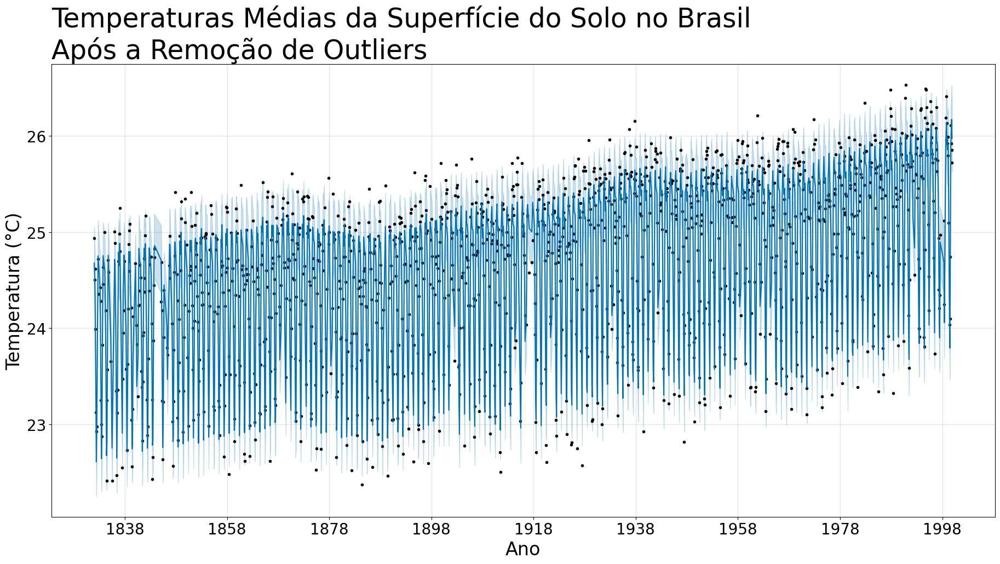

In [18]:
modelo.plot(previsao, figsize=(18,9));
plt.title('Temperaturas Médias da Superfície do Solo no Brasil \nApós a Remoção de Outliers', loc = 'left', fontsize = 35)
plt.xlabel('Ano', fontsize=24)
plt.ylabel('Temperatura (°C)', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [19]:
mean_squared_error(y_true = df_sem_outliers['y'], y_pred=previsao['yhat'][:1628])

0.0754092549472668

### INTERVALOS DE CONFIANÇA

O  intervalo  de  confiança  é  onde  estão  nossas  possíveis
soluções.  O  valor  default  do  Prophet  através  do  parâmetro
 interval_width  é de 0.80, ou seja, de 80%. Utilizando esse valor
default  para  um  período  de,  por  exemplo,  300  meses,  temos  o
seguinte resultado:

In [22]:
modelo = Prophet() 
modelo.fit(df_sem_outliers)
dataFramefuturo = modelo.make_future_dataframe(periods=300, freq='ME')
previsao = modelo.predict(dataFramefuturo)

14:06:42 - cmdstanpy - INFO - Chain [1] start processing
14:06:43 - cmdstanpy - INFO - Chain [1] done processing


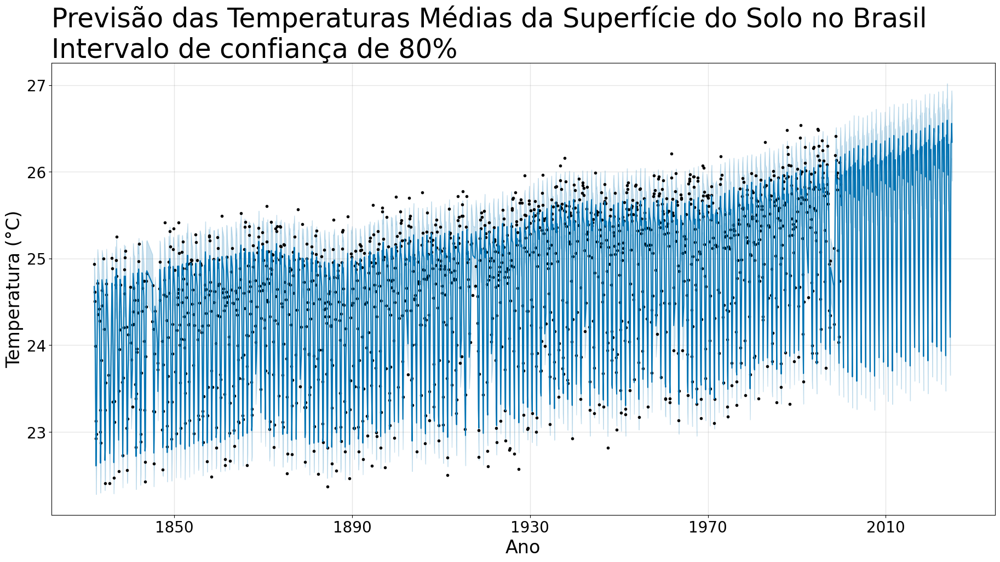

In [23]:
modelo.plot(previsao, figsize=(18,9));
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Previsão das Temperaturas Médias da Superfície do Solo no Brasil \nIntervalo de confiança de 80%', loc = 'left', fontsize = 35)
plt.xlabel('Ano', fontsize=24)
plt.ylabel('Temperatura (°C)', fontsize=24)
plt.show()

A região que não contém os pontos em preto é a nossa previsão
e  a  região mais  clara  em torno  é  o nosso  intervalo  de  confiança,
mas vamos analisar as componentes:

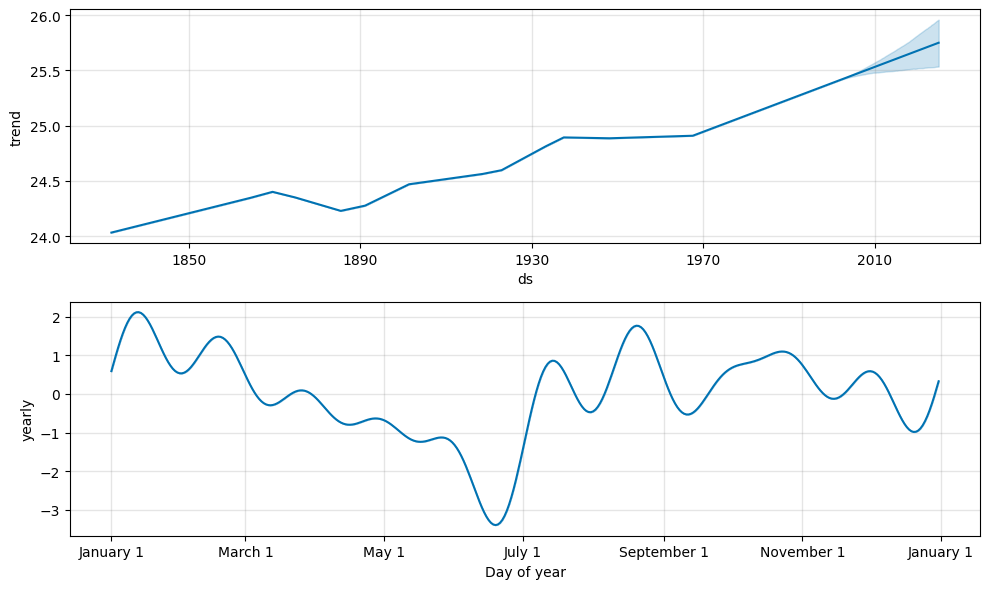

In [25]:
modelo.plot_components(previsao, figsize=(10,6));

No  gráfico  superior  da  tendência  (trend),  temos  a  faixa  em
cinza  claro  ao  final  da  linha  que  corresponde  ao  intervalo  de
confiança. Para  alterar  o  intervalo  de  confiança,  podemos  usar  o
argumento   `interval_width` .  Vamos  testar  alterar  o  intervalo
para 0.95:

In [27]:
modelo = Prophet( interval_width=0.95) 
modelo.fit(df_sem_outliers)
dataframefuturo = modelo.make_future_dataframe(periods=300, freq = 'ME')
previsao = modelo.predict(dataframefuturo)

14:06:44 - cmdstanpy - INFO - Chain [1] start processing
14:06:44 - cmdstanpy - INFO - Chain [1] done processing


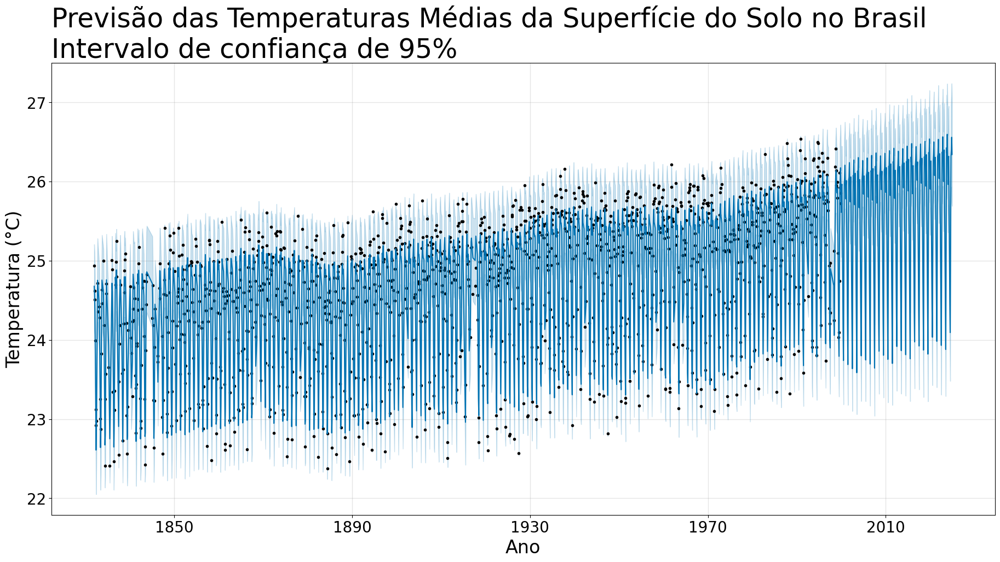

In [28]:
modelo.plot(previsao, figsize=(18,9));
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Previsão das Temperaturas Médias da Superfície do Solo no Brasil \nIntervalo de confiança de 95%', loc = 'left', fontsize = 35)
plt.xlabel('Ano', fontsize=24)
plt.ylabel('Temperatura (°C)', fontsize=24)
plt.show()

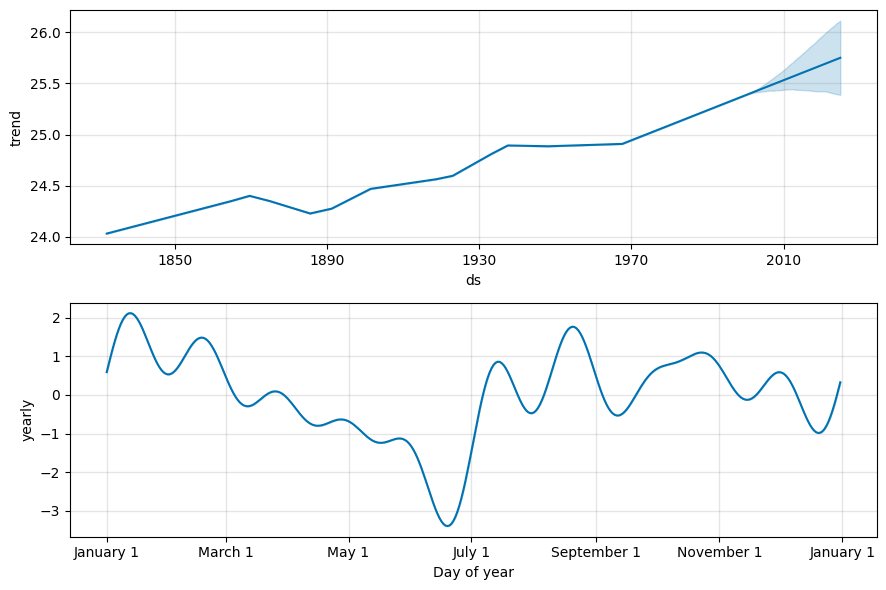

In [29]:
modelo.plot_components(previsao);

E' possível plotar um gráfico para que seja possível
visualizar o que são essas amostras. Então, faremos o  `plt.plot` 
recebendo  previsao  e  amostras.

In [31]:
amostras = modelo.predictive_samples(previsao)

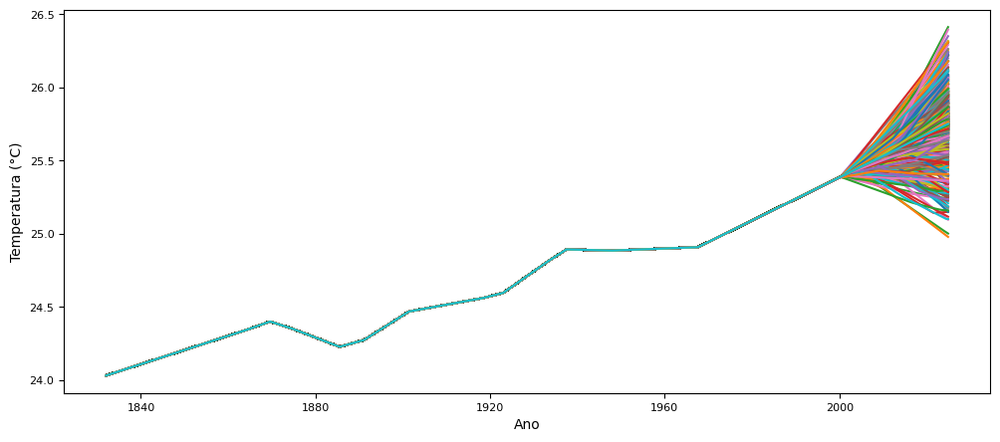

In [32]:
fig, ax = plt.subplots(figsize = (12, 5))
plt.plot(previsao['ds'],amostras['trend']);
plt.xlabel('Ano', fontsize=10)
plt.ylabel('Temperatura (°C)', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

### VALIDAÇÃO CRUZADA

In [34]:
from prophet.diagnostics import cross_validation

df_cv = cross_validation(modelo, initial='7300 days', period='1825 days', horizon = '3650 days')

  0%|          | 0/28 [00:00<?, ?it/s]

14:06:48 - cmdstanpy - INFO - Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing
14:06:49 - cmdstanpy - INFO - Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing
14:06:49 - cmdstanpy - INFO - Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing
14:06:49 - cmdstanpy - INFO - Chain [1] start processing
14:06:49 - cmdstanpy - INFO - Chain [1] done processing
14:06:50 - cmdstanpy - INFO - Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
14:06:50 - cmdstanpy - INFO - Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
14:06:50 - cmdstanpy - INFO - Chain [1] start processing
14:06:50 - cmdstanpy - INFO - Chain [1] done processing
14:06:51 - cmdstanpy - INFO - Chain [1] start processing
14:06:51 - cmdstanpy - INFO - Chain [1] done processing
14:06:51 - cmdstanpy - INFO - Chain [1] start processing
14:06:51 - cmdstanpy - INFO - Chain [1]

In [35]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1855-03-01,24.802269,24.360269,25.237441,24.982,1855-01-05
1,1855-05-01,23.589568,23.143654,24.053864,24.067,1855-01-05
2,1855-06-01,22.980773,22.516017,23.448683,23.189,1855-01-05
3,1855-07-01,23.224127,22.736653,23.686489,23.147,1855-01-05
4,1855-08-01,24.222679,23.763335,24.686573,24.175,1855-01-05
...,...,...,...,...,...,...
2794,1999-08-01,24.738861,24.203593,25.258490,24.743,1989-12-03
2795,1999-09-01,25.691775,25.172441,26.200830,26.109,1989-12-03
2796,1999-10-01,25.823386,25.268463,26.350964,25.922,1989-12-03
2797,1999-11-01,25.985504,25.407274,26.544434,25.723,1989-12-03


Portanto, os 7300 dias iniciais foram
treinados, e depois do dia 1989-12-03, os dados foram testados.

In [37]:
df_cv['cutoff'].unique()

<DatetimeArray>
['1855-01-05 00:00:00', '1860-01-04 00:00:00', '1865-01-02 00:00:00',
 '1870-01-01 00:00:00', '1874-12-31 00:00:00', '1879-12-30 00:00:00',
 '1884-12-28 00:00:00', '1889-12-27 00:00:00', '1894-12-26 00:00:00',
 '1899-12-25 00:00:00', '1904-12-24 00:00:00', '1909-12-23 00:00:00',
 '1914-12-22 00:00:00', '1919-12-21 00:00:00', '1924-12-19 00:00:00',
 '1929-12-18 00:00:00', '1934-12-17 00:00:00', '1939-12-16 00:00:00',
 '1944-12-14 00:00:00', '1949-12-13 00:00:00', '1954-12-12 00:00:00',
 '1959-12-11 00:00:00', '1964-12-09 00:00:00', '1969-12-08 00:00:00',
 '1974-12-07 00:00:00', '1979-12-06 00:00:00', '1984-12-04 00:00:00',
 '1989-12-03 00:00:00']
Length: 28, dtype: datetime64[ns]

In [38]:
janela = 1

cutoff = df_cv['cutoff'].unique()[janela]

df_cv_cut = df_cv[df_cv['cutoff'].values == cutoff]

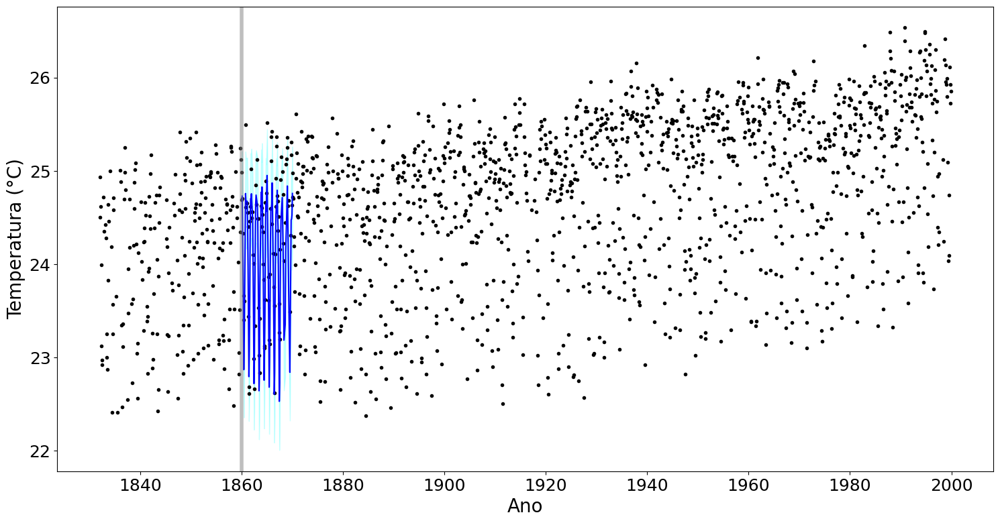

In [39]:
fig = plt.figure(figsize=(18,9))
ax = fig.add_subplot(111)

ax.plot(modelo.history['ds'].values, modelo.history['y'], '.k')
ax.plot(df_cv_cut['ds'].values, df_cv_cut['yhat'], ls='-', c='blue')

ax.fill_between(df_cv_cut['ds'].values, df_cv_cut['yhat_lower'],
                df_cv_cut['yhat_upper'], color='cyan',
                alpha=0.2)

ax.axvline(x=pd.to_datetime(cutoff), c='gray', lw=4, alpha=0.5)

ax.set_ylabel('y')
ax.set_xlabel('ds')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Ano', fontsize=20)
plt.ylabel('Temperatura (°C)', fontsize=20)
plt.show()

*Gráfico da validação-cruzada, evidenciando a primeira janela.*

In [41]:
janela = 10

cutoff = df_cv['cutoff'].unique()[janela]

df_cv_cut = df_cv[df_cv['cutoff'].values == cutoff]

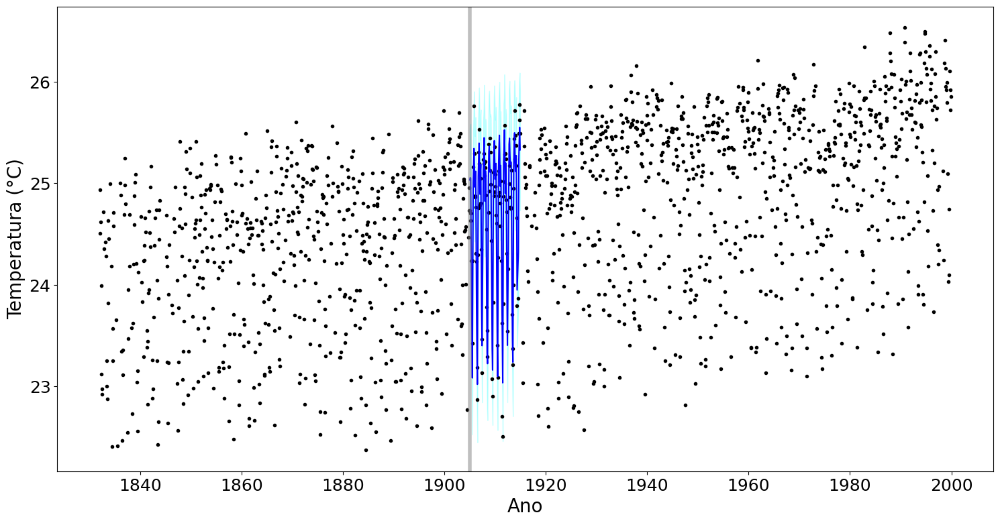

In [42]:
fig = plt.figure(figsize=(18,9))
ax = fig.add_subplot(111)

ax.plot(modelo.history['ds'].values, modelo.history['y'], '.k')
ax.plot(df_cv_cut['ds'].values, df_cv_cut['yhat'], ls='-', c='blue')

ax.fill_between(df_cv_cut['ds'].values, df_cv_cut['yhat_lower'],
                df_cv_cut['yhat_upper'], color='cyan',
                alpha=0.2)

ax.axvline(x=pd.to_datetime(cutoff), c='gray', lw=4, alpha=0.5)

ax.set_ylabel('y')
ax.set_xlabel('ds')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Ano', fontsize=20)
plt.ylabel('Temperatura (°C)', fontsize=20)
plt.show()

### MÉTRICAS DE PERFORMANCE

In [44]:
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

df_p = performance_metrics(df_cv)

df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,361 days,0.087168,0.295243,0.247179,0.010033,0.009156,0.010035,0.931900
1,362 days,0.086257,0.293695,0.245549,0.009966,0.009151,0.009969,0.931900
2,363 days,0.086339,0.293834,0.245711,0.009971,0.009151,0.009974,0.931900
3,364 days,0.086741,0.294518,0.246587,0.010005,0.009156,0.010008,0.931900
4,365 days,0.087632,0.296028,0.247596,0.010046,0.009156,0.010048,0.928315


In [45]:
df_p.head().T

,0,1,2,3,4
horizon,361 days 00:00:00,362 days 00:00:00,363 days 00:00:00,364 days 00:00:00,365 days 00:00:00
mse,0.087168,0.086257,0.086339,0.086741,0.087632
rmse,0.295243,0.293695,0.293834,0.294518,0.296028
mae,0.247179,0.245549,0.245711,0.246587,0.247596
mape,0.010033,0.009966,0.009971,0.010005,0.010046
mdape,0.009156,0.009151,0.009151,0.009156,0.009156
smape,0.010035,0.009969,0.009974,0.010008,0.010048
coverage,0.9319,0.9319,0.9319,0.9319,0.928315


C:\Users\lsoares\AppData\Local\anaconda3\Lib\site-packages\prophet\plot.py:546: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt = df_none['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])
C:\Users\lsoares\AppData\Local\anaconda3\Lib\site-packages\prophet\plot.py:547: FutureWarning: Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.
  x_plt_h = df_h['horizon'].astype('timedelta64[ns]').view(np.int64) / float(dt_conversions[i])


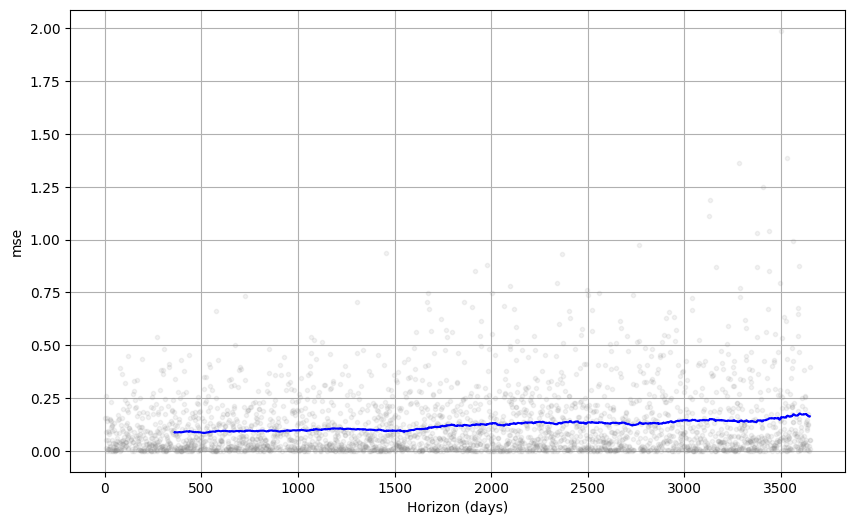

In [46]:
plot_cross_validation_metric(df_cv,metric='mse');

O  gráfico  mostra  o MSE  a  cada  horizonte,  e  é  possível  notar
que,  conforme os horizontes  aumentam, maior  é  a dispersão dos
pontos.  Esses  pontos  em  cinza  claro  são  os  erros  em  torno  da
previsão. A linha em azul corresponde à média dos valores
e, quanto mais próximos dela os pontos estiverem, melhor.

# HIPERPARÂMETROS

Para  ajustar os hiperparâmetros nos nossos dados o  primeiro
passo  será  criar  um  dicionário  com  os  possíveis  parâmetros  a
serem  testados. 

In [50]:
param_grid = {'changepoint_prior_scale': [0.001,0.01,0.1,0.5],                 
              'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],                                          
              'seasonality_mode': ['additive','multiplicative']}

A  seguir  é necessário  importar  o   itertools , para  rodar  as
iterações dos parâmetros adicionados ao dicionário, pois teremos
32 combinações diferentes.

Além  de  rodar  essa  iteração,  será  necessário  criar  uma  lista
com  uma  das  métricas  de  performance.  

In [52]:
import itertools

# Generate all possible combinations of parameter values from the parameter grid
all_params = [dict(zip(param_grid.keys(), value))  
              for value in itertools.product(
                                  *param_grid.values())]  

# Initialize an empty list to store Mean Squared Error (MSE) values for each parameter set
mse_values= []  

Em  seguida,  nós  criamos  o  código  a  seguir  para  rodar  a
 cross-validation  para cada combinação de parâmetros. Então,
passamos  os  parâmetros  a  serem  analisados  ao  Prophet. Os  dois
asteriscos  antes  de   params   servem  para  pegar  os  nomes  dos
argumentos e com os nomes é possível trazer seus valores, já que
os nomes são organizados  em um dicionário. 

In [54]:
# Iterate over each set of parameters in all_params
for params in all_params:  
    # Initialize and fit the Prophet model with the current parameters
    modelo = Prophet(**params).fit(df_sem_outliers)  
    
    # Perform cross-validation with specified initial, period, and horizon values
    df_cv = cross_validation(modelo, initial='7300 days', period='1825 days',  
                             horizon='3650 days', parallel='processes')  
    
    # Compute performance metrics for the cross-validation results
    df_p = performance_metrics(df_cv, rolling_window=1)  
    
    # Append the Mean Squared Error (MSE) value from performance metrics to mse_values list
    mse_values.append(df_p['mse'].values[0])  

14:07:03 - cmdstanpy - INFO - Chain [1] start processing
14:07:03 - cmdstanpy - INFO - Chain [1] done processing
14:07:07 - cmdstanpy - INFO - Chain [1] start processing
14:07:07 - cmdstanpy - INFO - Chain [1] done processing
14:07:10 - cmdstanpy - INFO - Chain [1] start processing
14:07:10 - cmdstanpy - INFO - Chain [1] done processing
14:07:14 - cmdstanpy - INFO - Chain [1] start processing
14:07:14 - cmdstanpy - INFO - Chain [1] done processing
14:07:18 - cmdstanpy - INFO - Chain [1] start processing
14:07:18 - cmdstanpy - INFO - Chain [1] done processing
14:07:22 - cmdstanpy - INFO - Chain [1] start processing
14:07:22 - cmdstanpy - INFO - Chain [1] done processing
14:07:25 - cmdstanpy - INFO - Chain [1] start processing
14:07:25 - cmdstanpy - INFO - Chain [1] done processing
14:07:29 - cmdstanpy - INFO - Chain [1] start processing
14:07:29 - cmdstanpy - INFO - Chain [1] done processing
14:07:34 - cmdstanpy - INFO - Chain [1] start processing
14:07:34 - cmdstanpy - INFO - Chain [1]

In [55]:
results = pd.DataFrame(all_params)
results['mse'] = mse_values
results

,changepoint_prior_scale,seasonality_prior_scale,seasonality_mode,mse
0,0.001,0.01,additive,0.097601
1,0.001,0.01,multiplicative,0.097408
2,0.001,0.10,additive,0.097760
3,0.001,0.10,multiplicative,0.097230
4,0.001,1.00,additive,0.098324
5,0.001,1.00,multiplicative,0.097736
6,0.001,10.00,additive,0.097105
7,0.001,10.00,multiplicative,0.097073
8,0.010,0.01,additive,0.105015
9,0.010,0.01,multiplicative,0.104816


In [56]:
import numpy as np

best_params = all_params[np.argmin(mse_values)]
print(best_params)

{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0, 'seasonality_mode': 'multiplicative'}


Esta foi  a nossa melhor  combinação  e  chegou o momento de
rodar a previsão para 300 meses com os  best_params :

In [58]:
# Initialize the Prophet model with specified hyperparameters
modelo = Prophet(changepoint_prior_scale=0.001,  # Control sensitivity to changepoints
                 seasonality_prior_scale=0.1,    # Control influence of seasonality components
                 seasonality_mode='additive')    # Use additive seasonality

# Fit the model to the data without outliers
modelo.fit(df_sem_outliers)  

# Create a future dataframe with 300 months ahead
dataframefuturo = modelo.make_future_dataframe(periods=300, freq='ME')  

# Generate predictions for the future dataframe
previsao = modelo.predict(dataframefuturo)  

14:09:24 - cmdstanpy - INFO - Chain [1] start processing
14:09:24 - cmdstanpy - INFO - Chain [1] done processing


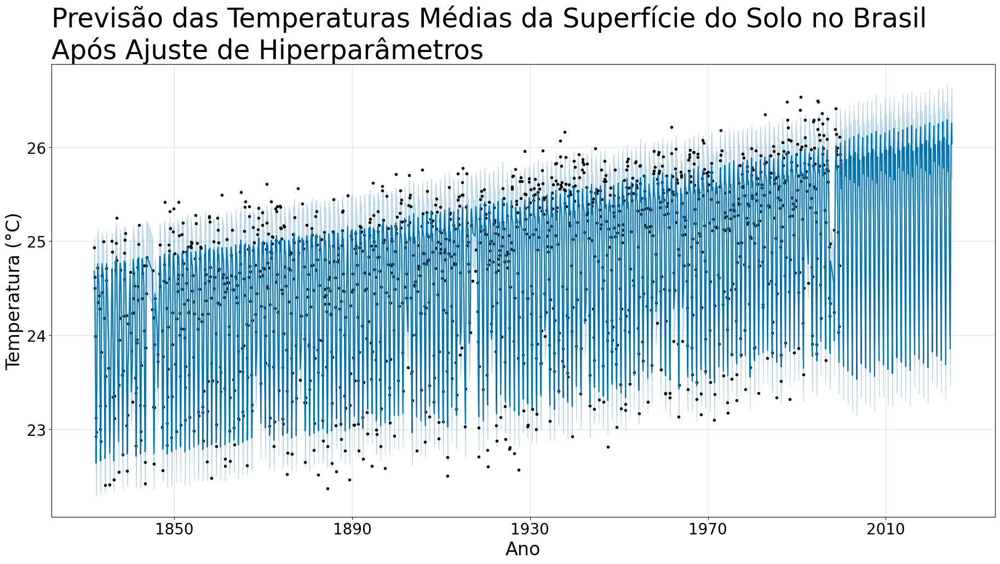

In [59]:
modelo.plot(previsao, figsize=(18,9));
ax = fig.add_subplot()
plt.title('Previsão das Temperaturas Médias da Superfície do Solo no Brasil \nApós Ajuste de Hiperparâmetros', loc = 'left', fontsize = 35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Ano', fontsize=24)
plt.ylabel('Temperatura (°C)', fontsize=24)
plt.show()

### Gráficos interativos com Plotly

In [61]:
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import plot, iplot

In [62]:
from prophet.plot import (
    plot_plotly,
    plot_components_plotly,
    plot_seasonality_plotly
)

In [63]:
fig = plot_plotly(modelo, previsao)
py.iplot(fig)

In [64]:
fig = plot_plotly(modelo, previsao, trend=True)
py.iplot(fig)

In [65]:
fig = plot_components_plotly(modelo, previsao, figsize=(600, 300))
py.iplot(fig)

In [66]:
fig = plot_seasonality_plotly(modelo, 'yearly')
py.iplot(fig)

### MODELAGEM DE FERIADOS E EVENTOS ESPECIAIS

In [68]:
import yfinance as yf

df_acao = yf.download('TAEE11.SA',end='2022-02-04', auto_adjust=False)

df_acao.round(2).head()

[*********************100%***********************]  1 of 1 completed


Price,Adj Close,Close,High,Low,Open,Volume
Ticker,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA
Date,,,,,,
2007-11-13,2.57,11.48,11.50,11.33,11.33,33000
2007-11-14,2.61,11.67,11.68,11.65,11.67,100500
2007-11-16,2.50,11.17,11.77,11.10,11.77,41700
2007-11-19,2.53,11.30,11.33,11.30,11.33,7200
2007-11-21,2.28,10.17,11.30,10.17,11.30,16800


In [69]:
# Dados de treino
df_treino = pd.DataFrame()                           # Cria um DataFrame vazio para armazenar os dados de treino
df_treino['ds'] = df_acao.index[:3400]               # Define a coluna 'ds' com as datas dos primeiros 3400 registros
df_treino['y'] = df_acao['Adj Close'][:3400].values  # Define a coluna 'y' com os valores ajustados de fechamento (Adj Close)

# Dados de teste
df_teste = pd.DataFrame()                            # Cria um DataFrame vazio para armazenar os dados de teste
df_teste['ds'] = df_acao.index[3400:]                # Define a coluna 'ds' com as datas a partir do índice 3400
df_teste['y'] = df_acao['Adj Close'][3400:].values   # Define a coluna 'y' com os valores ajustados de fechamento para teste

In [70]:
# Configura o modelo Prophet com sazonalidades e pontos de mudança
modelo = Prophet(seasonality_mode='additive',    # Define o modo sazonal como aditivo
                 daily_seasonality=False,        # Desativa sazonalidade diária
                 weekly_seasonality=True,        # Ativa sazonalidade semanal
                 yearly_seasonality=True,        # Ativa sazonalidade anual
                 n_changepoints=5)               # Define o número de pontos de mudança na tendência

# Treina o modelo Prophet com os dados de treino
modelo.fit(df_treino)

# Cria um DataFrame futuro para previsão com frequência diária e 184 períodos no futuro
dataframefuturo = modelo.make_future_dataframe(freq='D', periods=184)

# Gera previsões para os períodos futuros
previsao = modelo.predict(dataframefuturo)

14:09:37 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing


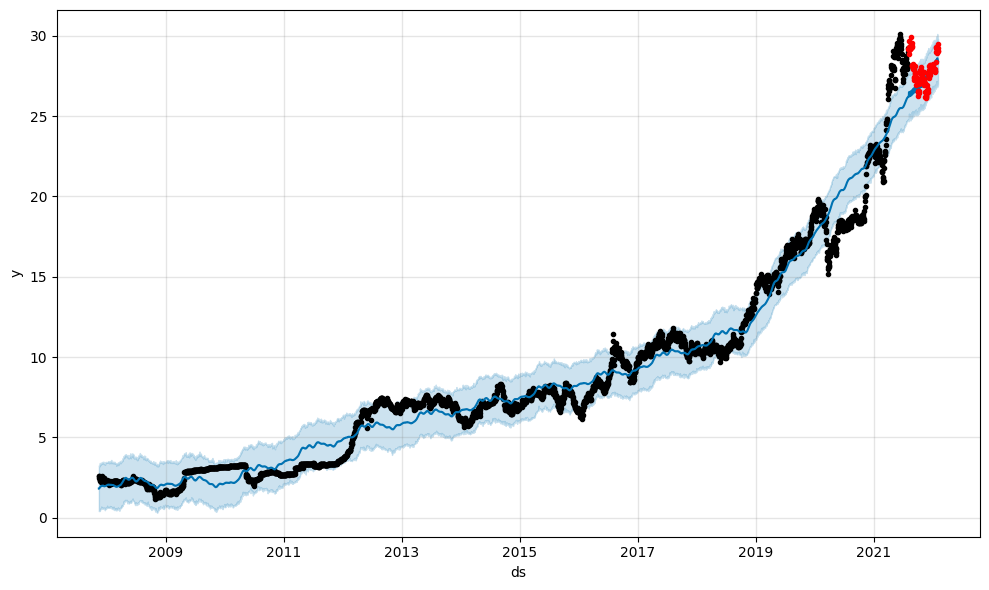

In [71]:
# Construção do gráfico
fig = modelo.plot(previsao)                    # Plota a previsão gerada pelo modelo Prophet

# Adiciona os dados de teste ao gráfico em vermelho
plt.plot(df_teste['ds'], df_teste['y'], '.r'); # Plota os pontos reais do conjunto de teste em vermelho

In [72]:
df_teste['ds'][125]

Timestamp('2022-02-03 00:00:00')

In [73]:
dataframefuturo['ds'][3583]

Timestamp('2022-02-03 00:00:00')

### Feriados

In [75]:
# Define o modelo Prophet com sazonalidade aditiva e algumas configurações
modelo = Prophet(seasonality_mode='additive',  # Define o modelo como aditivo
                 daily_seasonality=False,      # Desativa sazonalidade diária
                 weekly_seasonality=True,      # Ativa sazonalidade semanal
                 yearly_seasonality=True,      # Ativa sazonalidade anual
                 n_changepoints=5)             # Define o número de pontos de mudança permitidos

# Adiciona os feriados do Brasil ao modelo
modelo.add_country_holidays(country_name='BR')                         # Incorpora feriados brasileiros na previsão

# Treina o modelo com os dados de treino
modelo.fit(df_treino)                                                  # Ajusta o modelo aos dados históricos

# Cria um DataFrame futuro para previsão
dataframefuturo = modelo.make_future_dataframe(freq='D', periods=185)  # Gera previsões para os próximos 185 dias

# Gera previsões para as datas futuras
previsao = modelo.predict(dataframefuturo)                             # Calcula as previsões com base no modelo ajustado

14:09:43 - cmdstanpy - INFO - Chain [1] start processing
14:09:43 - cmdstanpy - INFO - Chain [1] done processing


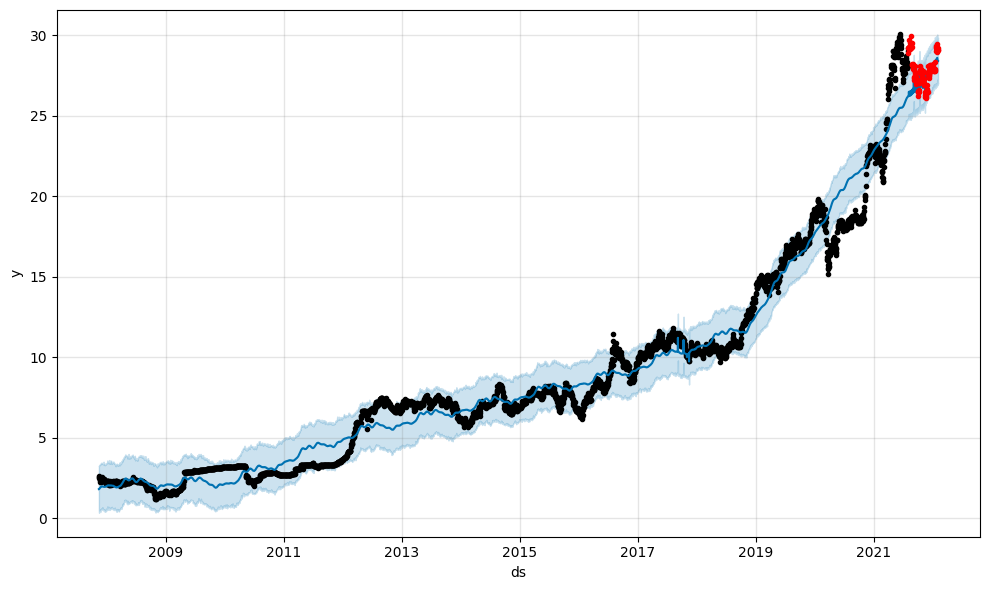

In [76]:
# Construção do gráfico
fig = modelo.plot(previsao)                        # Plota a previsão gerada pelo modelo Prophet

# Adiciona os pontos reais do conjunto de teste ao gráfico
plt.plot(df_teste['ds'], df_teste['y'], '.r') ;    # Plota os dados reais do conjunto de teste em vermelho

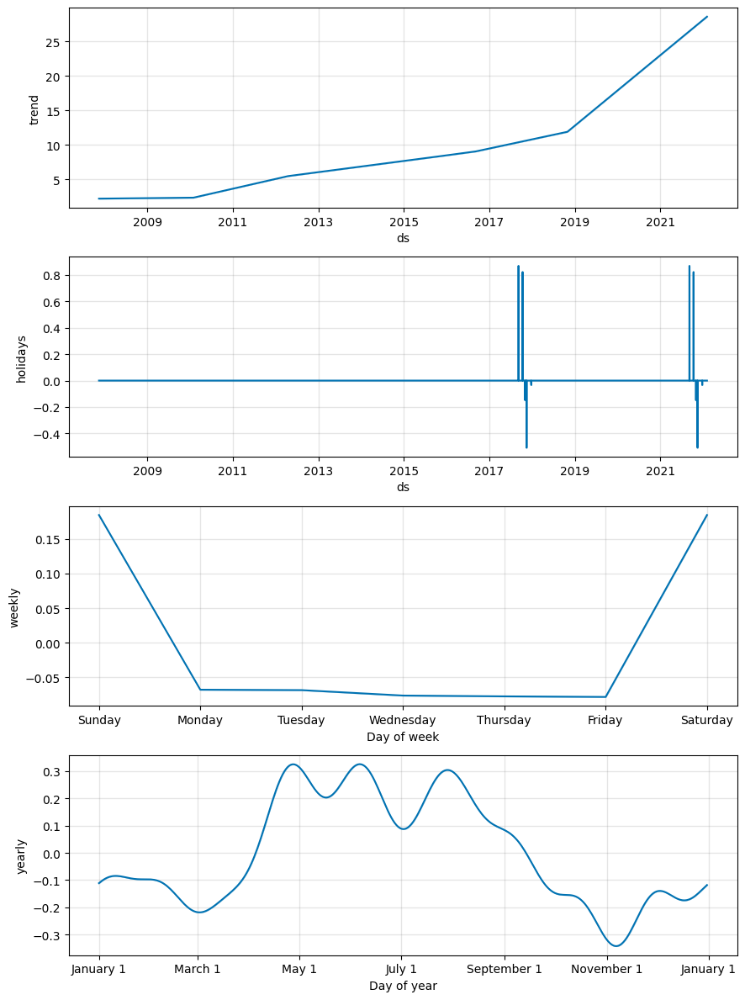

In [77]:
modelo.plot_components(previsao);

In [78]:
modelo.train_holiday_names

0    Universal Fraternization Day
1                     Good Friday
2                 Tiradentes' Day
3                    Worker's Day
4                Independence Day
5           Our Lady of Aparecida
6                  All Souls' Day
7       Republic Proclamation Day
8                   Christmas Day
dtype: object

In [79]:
previsao.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'All Souls' Day', 'All Souls' Day_lower', 'All Souls' Day_upper',
       'Christmas Day', 'Christmas Day_lower', 'Christmas Day_upper',
       'Good Friday', 'Good Friday_lower', 'Good Friday_upper',
       'Independence Day', 'Independence Day_lower', 'Independence Day_upper',
       'Our Lady of Aparecida', 'Our Lady of Aparecida_lower',
       'Our Lady of Aparecida_upper', 'Republic Proclamation Day',
       'Republic Proclamation Day_lower', 'Republic Proclamation Day_upper',
       'Tiradentes' Day', 'Tiradentes' Day_lower', 'Tiradentes' Day_upper',
       'Universal Fraternization Day', 'Universal Fraternization Day_lower',
       'Universal Fraternization Day_upper', 'Worker's Day',
       'Worker's Day_lower', 'Worker's Day_upper', 'additive_terms',
       'additive_terms_lower', 'additive_terms_upper', 'holidays',
       'holidays_lower', 'holidays_upper', 'weekly', 'weekly_lower',
       '

In [80]:
col_feriados = previsao[['ds',*modelo.train_holiday_names.tolist()]]
col_feriados.head()

,ds,Universal Fraternization Day,Good Friday,Tiradentes' Day,Worker's Day,Independence Day,Our Lady of Aparecida,All Souls' Day,Republic Proclamation Day,Christmas Day
0,2007-11-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2007-11-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2007-11-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007-11-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2007-11-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
col_feriados.columns = ['ds','Dia da Fraternidade','Ano_novo','Tiradentes','Trabalho','Independencia','Aparecida','Finados','Republica','Natal']
col_feriados.head()

,ds,Dia da Fraternidade,Ano_novo,Tiradentes,Trabalho,Independencia,Aparecida,Finados,Republica,Natal
0,2007-11-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2007-11-14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2007-11-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007-11-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2007-11-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [82]:
contrib_feriados = col_feriados.query('Ano_novo !=0 or Tiradentes !=0 or Trabalho != 0 or Independencia != 0 or Aparecida != 0 or Finados != 0 or Republica != 0 or Natal != 0')
contrib_feriados.head()  

,ds,Dia da Fraternidade,Ano_novo,Tiradentes,Trabalho,Independencia,Aparecida,Finados,Republica,Natal
2431,2017-09-07,0.0,0.0,0.0,0.0,0.867407,0.000000,0.000000,0.000000,0.00000
2456,2017-10-12,0.0,0.0,0.0,0.0,0.000000,0.820671,0.000000,0.000000,0.00000
2471,2017-11-02,0.0,0.0,0.0,0.0,0.000000,0.000000,-0.148734,0.000000,0.00000
2480,2017-11-15,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,-0.507949,0.00000
2508,2017-12-25,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,-0.03407


In [83]:
resumo_feriados = pd.DataFrame()

resumo_feriados['ds'] = contrib_feriados['ds']

resumo_feriados['feriados'] = contrib_feriados[['Ano_novo','Tiradentes','Trabalho','Independencia','Aparecida','Finados','Republica','Natal']].sum(axis=1)

resumo_feriados.round(2)

,ds,feriados
2431,2017-09-07,0.87
2456,2017-10-12,0.82
2471,2017-11-02,-0.15
2480,2017-11-15,-0.51
2508,2017-12-25,-0.03
3434,2021-09-07,0.87
3469,2021-10-12,0.82
3490,2021-11-02,-0.15
3503,2021-11-15,-0.51
3543,2021-12-25,-0.03


### Datas Customizadas

In [85]:
# Obtém informações sobre a ação 'TAEE11.SA' usando a biblioteca yfinance
informacoes = yf.Ticker('TAEE11.SA')  # Cria um objeto para obter dados da ação

# Itera sobre todas as informações disponíveis no dicionário retornado
for chave, valor in informacoes.info.items():
    print(chave, ':', valor)          # Exibe a chave (descrição da informação) e seu respectivo valor

address1 : Avenue das AmEricas, No. 2480
address2 : Block 6 Sala 201 Barra da Tijuca
city : Rio De Janeiro
state : RJ
country : Brazil
phone : 55 21 2212 6000
website : https://institucional.taesa.com.br/
industry : Utilities - Regulated Electric
industryKey : utilities-regulated-electric
industryDisp : Utilities - Regulated Electric
sector : Utilities
sectorKey : utilities
sectorDisp : Utilities
longBusinessSummary : Transmissora Aliança de Energia Elétrica S.A., together with its subsidiaries, engages in the implementation, operation, and maintenance of electric power transmission lines in Brazil. It operates approximately a total length of 15,1550 kilometers (km) of transmission lines, which include 14,420 km of transmission lines in operation and 735 km of lines under construction; 110 substations with voltage between 69 and 525kV; and one system operation center located in Rio de Janeiro. The company was founded in 2000 is headquartered in Rio de Janeiro, Brazil.
fullTimeEmployees

In [86]:
dividendos = pd.DataFrame(informacoes.dividends)
dividendos.head()

,Dividends
Date,
2008-07-31 00:00:00-03:00,0.321393
2009-03-11 00:00:00-03:00,0.034538
2009-10-19 00:00:00-02:00,1.147840
2010-11-09 00:00:00-02:00,0.403533
2011-04-28 00:00:00-03:00,1.265340


In [87]:
dividendos.shape

(53, 1)

In [88]:
datas_dividendos = pd.DataFrame({
    'holiday': 'dividendos',
    'ds': pd.to_datetime(dividendos.index),
    'lower_window': 0,
    'upper_window': 0,
})

In [89]:
datas_dividendos.head()

,holiday,ds,lower_window,upper_window
0,dividendos,2008-07-31 00:00:00-03:00,0,0
1,dividendos,2009-03-11 00:00:00-03:00,0,0
2,dividendos,2009-10-19 00:00:00-02:00,0,0
3,dividendos,2010-11-09 00:00:00-02:00,0,0
4,dividendos,2011-04-28 00:00:00-03:00,0,0


### Gráficos de velas

In [91]:
df_acao

Price,Adj Close,Close,High,Low,Open,Volume
Ticker,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA,TAEE11.SA
Date,,,,,,
2007-11-13,2.570930,11.483333,11.500000,11.333333,11.333333,33000
2007-11-14,2.611975,11.666666,11.683333,11.650000,11.666666,100500
2007-11-16,2.500033,11.166666,11.770000,11.100000,11.766666,41700
2007-11-19,2.530631,11.303333,11.333333,11.300000,11.333333,7200
2007-11-21,2.276897,10.170000,11.303333,10.170000,11.303333,16800
...,...,...,...,...,...,...
2022-01-28,29.092007,37.779999,37.910000,37.400002,37.770000,1501400
2022-01-31,29.477022,38.279999,38.310001,37.680000,37.700001,1587200


In [92]:
# Rename Columns to Single-Level
df_acao.columns = [col[0] for col in df_acao.columns] 
df_acao.head()

,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2007-11-13,2.570930,11.483333,11.500000,11.333333,11.333333,33000
2007-11-14,2.611975,11.666666,11.683333,11.650000,11.666666,100500
2007-11-16,2.500033,11.166666,11.770000,11.100000,11.766666,41700
2007-11-19,2.530631,11.303333,11.333333,11.300000,11.333333,7200
2007-11-21,2.276897,10.170000,11.303333,10.170000,11.303333,16800


In [93]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Candlestick(x=df_acao.index,
                open=df_acao['Open'],
                high=df_acao['High'],
                low=df_acao['Low'],
                close=df_acao['Close'],
                increasing_line_color= 'green', decreasing_line_color= 'red'
)])
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

#fig.show(renderer="browser")  # Opens in browser